## Assignment 2: Time Series Forecasting

### Jay Chavan  a1936480 

#### Follow detail instructions in the assignment specification and use these heading for implementation and discussion

#### Note from previous assignment: To avoid using unnecessary visualizations that do not contribute directly to the findings.

### 1. Read the dataset

In [173]:
#Import Libraries
import numpy as np
import pandas as pd
from datetime import datetime as dt

# Import Data Visualisation Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pl
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
%matplotlib inline

# Set the plot style and display options
plt.style.use('ggplot')
sns.set()

# To display all the columns in Dataframe
pd.set_option('display.max_columns', None)


In [174]:
# Import the dataset
data_raw = pd.read_csv('energydata_complete.csv')

Creating a copy of dataset to perform operations

In [175]:
#creating a copy of data set
data = data_raw.copy()

In [176]:
# Dataset First Look
data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [177]:
# Dataset Rows & Columns count
num_rows, num_cols = data.shape

print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 19735
Number of columns: 29


In [178]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [179]:
# Assuming your date column is named "date_column"
data['date'] = pd.to_datetime(data['date'])

In [180]:
# Setting date as the index:
data.set_index('date', inplace=True)

In [181]:
# Dataset Duplicate Value Count assinged a dataframe name 'df'
df = data[data.duplicated()]

In [182]:
#There is no duplicate rows in the data
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [183]:
# Missing Values/Null Values Count
data.isna().sum()

Appliances 0
lights 0
T1 0
RH_1 0
T2 0
RH_2 0
T3 0
RH_3 0
T4 0
RH_4 0
T5 0
RH_5 0
T6 0
RH_6 0
T7 0
RH_7 0
T8 0
RH_8 0
T9 0
RH_9 0
T_out 0
Press_mm_hg 0
RH_out 0
Windspeed 0
Visibility 0
Tdewpoint 0
rv1 0
rv2 0
dtype: int64

In [184]:
# Dataset Columns
data.columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [185]:
# Dataset Describe
data.describe(include='all')

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


#  Variables Description
The observation data consists of the following variables:

datetime year-month-day hour : minute:second

Appliances: energy use in Wh [TARGETED]

lights: energy use of light fixtures in the house in Wh

T1: Temperature in kitchen area, in Celsius

RH_1: Humidity in kitchen area, in %

T2: Temperature in living room area, in Celsius

RH_2:Humidity in living room area, in %

T3:Temperature in laundry room area

RH_3:Humidity in laundry room area, in %

T4:Temperature in office room, in Celsius

RH_4:Humidity in office room, in %

T5:Temperature in bathroom, in Celsius

RH_5:Humidity in bathroom, in %

T6:Temperature outside the building (north side), in Celsius

RH_6:Humidity outside the building (north side), in %

T7:Temperature in ironing room , in Celsius

RH_7:Humidity in ironing room, in %

T8:Temperature in teenager room 2, in Celsius

RH_8:Humidity in teenager room 2, in %

T9:Temperature in parents room, in Celsius

RH_9:Humidity in parents room, in %

T_out:Temperature outside (from Chièvres weather station), in Celsius

Press_mm_hg: (from Chièvres weather station), in mm Hg

RH_out: Humidity outside (from Chièvres weather station), in %

Windspeed: (from Chièvres weather station), in m/s

Visibility: (from Chièvres weather station), in km

Tdewpoint: (from Chièvres weather station), °C

rv1: Random variable 1, nondimensional

rv2: Rnadom variable 2, nondimensional



In [186]:
# Checking Unique Values count for each variable.
for i in data.columns.tolist():
  print("The unique values in",i, "is",data[i].nunique(),".")

The unique values in Appliances is 92 .
The unique values in lights is 8 .
The unique values in T1 is 722 .
The unique values in RH_1 is 2547 .
The unique values in T2 is 1650 .
The unique values in RH_2 is 3376 .
The unique values in T3 is 1426 .
The unique values in RH_3 is 2618 .
The unique values in T4 is 1390 .
The unique values in RH_4 is 2987 .
The unique values in T5 is 2263 .
The unique values in RH_5 is 7571 .
The unique values in T6 is 4446 .
The unique values in RH_6 is 9709 .
The unique values in T7 is 1955 .
The unique values in RH_7 is 5891 .
The unique values in T8 is 2228 .
The unique values in RH_8 is 6649 .
The unique values in T9 is 924 .
The unique values in RH_9 is 3388 .
The unique values in T_out is 1730 .
The unique values in Press_mm_hg is 2189 .
The unique values in RH_out is 566 .
The unique values in Windspeed is 189 .
The unique values in Visibility is 413 .
The unique values in Tdewpoint is 1409 .
The unique values in rv1 is 19735 .
The unique values in r

In [187]:
# Round the unique values to two decimal places
rounded_unique_values = data.apply(lambda x: set(round(val, 2) for val in x))

### Information Gathered About Dataset

Dataset contains 19,735 data points, which is a significant amount of data.

The columns labeled 'T1,' 'T2,' 'T3,' etc., represent temperature measurements, while columns labeled 'RH_1,' 'RH_2,' 'RH_3,' etc., represent relative humidity measurements. 'Appliances' and 'lights' are integer columns, which might be related to energy consumption and lighting.

There are no missing values and no duplicate values

### 2. Analyse and visualise the data

2.1 Analysing and modifying the data for better visualization

In [188]:
# Create a dictionary to map current column names to new column names
column_mapping = {'T1': 'KITCHEN_TEMP',
    'RH_1': 'KITCHEN_HUM',
    'T2': 'LIVING_TEMP',
    'RH_2' :'LIVING_HUM',
    'T3': 'BEDROOM_TEMP',
    'RH_3':'BEDROOM_HUM',
    'T4' : 'OFFICE_TEMP',
    'RH_4' : 'OFFICE_HUM',
    'T5' : 'BATHROOM_TEMP',
    'RH_5': 'BATHROOM_HUM',
    'T6':'OUTSIDE_TEMP_build',
    'RH_6': 'OUTSIDE_HUM_build',
    'T7': 'IRONING_ROOM_TEMP',
    'RH_7' : 'IRONING_ROOM_HUM',
    'T8' :'TEEN_ROOM_2_TEMP',
    'RH_8' : 'TEEN_ROOM_HUM',
    'T9': 'PARENTS_ROOM_TEMP',
    'RH_9': 'PARENTS_ROOM_HUM',
    'T_out' :'OUTSIDE_TEMP_wstn',
    'RH_out' :'OUTSIDE_HUM_wstn'}

# Rename the columns using the mapping
data.rename(columns=column_mapping, inplace=True)

In [189]:
data.head()

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [190]:
# Additional feature creation
data['month'] = data.index.month
data['weekday'] = data.index.weekday
data['hour'] = data.index.hour
#data['week'] = data.index.week # This line is commented, uncomment if week feature is needed
data['day'] = data.index.day
data['day_of_week'] = data.index.dayofweek

Time-related features like month, weekday, hour, day, and day_of_week are extracted from the date column. These additional features could potentially assist in capturing time-dependent patterns in energy usage, thereby enhancing the predictive model's performance. 

In [191]:
data.head(2)

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour,day,day_of_week
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.7900,19.79,44.73,19.0,45.566667,17.166667,55.2,7.026667,84.256667,17.2,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17,11,0
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.7225,19.79,44.79,19.0,45.992500,17.166667,55.2,6.833333,84.063333,17.2,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17,11,0


In [192]:
# Counting values of the "lights" column:
data['lights'].value_counts(normalize=True)

0 0.772840
10 0.112085
20 0.082290
30 0.028325
40 0.003902
50 0.000456
70 0.000051
60 0.000051
Name: lights, dtype: float64

77% value of lights column are 0 and it is not relevant for prediction. so we are going to drop this column

In [193]:
# Dropping the lights column:
data.drop(columns='lights', inplace=True)

In [194]:
#reorder the data for clear vision
desired_order = ['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','OUTSIDE_TEMP_build','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP','OUTSIDE_TEMP_wstn',
                 'KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM','OFFICE_HUM','BATHROOM_HUM','OUTSIDE_HUM_build','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM','OUTSIDE_HUM_wstn',
                 "Tdewpoint","Press_mm_hg","Windspeed","Visibility","rv1", "rv2",'month','weekday','hour','week','day','day_of_week',"Appliances"]
#assinging new_data as new name of dataframe
data = data.reindex(columns=desired_order)

In [195]:
data.tail(2)

,KITCHEN_TEMP,LIVING_TEMP,BEDROOM_TEMP,OFFICE_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,BATHROOM_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,OUTSIDE_HUM_wstn,Tdewpoint,Press_mm_hg,Windspeed,Visibility,rv1,rv2,month,weekday,hour,week,day,day_of_week,Appliances
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-27 17:50:00,25.5,25.414000,26.890000,24.7,23.2,22.433333,24.5,24.6625,23.2,22.333333,46.99,43.036000,41.290000,45.790000,52.2,1.0,44.295714,49.51875,46.8175,56.666667,13.233333,755.2,3.833333,26.166667,6.322784,6.322784,5,4,17,NaN,27,4,420
2016-05-27 18:00:00,25.5,25.264286,26.823333,24.7,23.2,21.026667,24.5,24.7360,23.2,22.200000,46.60,42.971429,41.156667,45.963333,52.2,1.0,44.054000,49.73600,46.8450,57.000000,13.200000,755.2,4.000000,27.000000,34.118851,34.118851,5,4,18,NaN,27,4,430


2.2 Visualizing Data & Understanding relationships between Variables

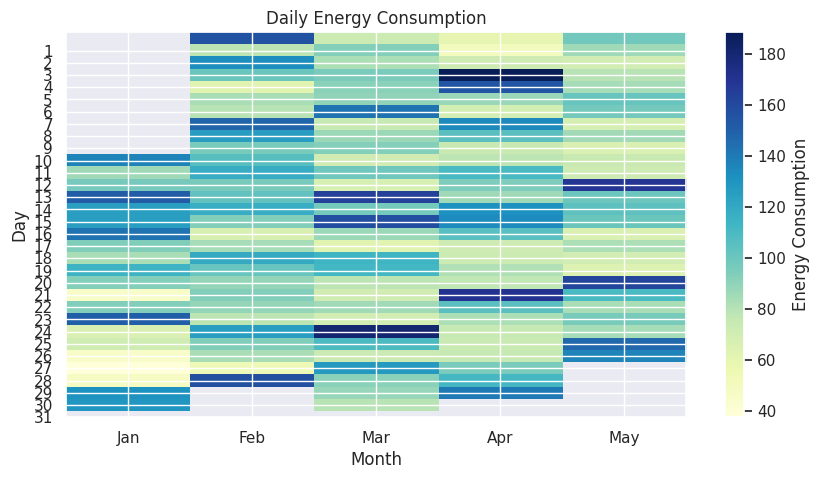

In [196]:
# Create a pivot table to aggregate the daily energy consumption
daily_energy = data.pivot_table(values='Appliances', index='day', columns='month', aggfunc = 'mean')

# Create a heatmap using the pivot table
plt.figure(figsize=(10, 5))
plt.title('Daily Energy Consumption')
plt.xlabel('Month')
plt.ylabel('Day')
plt.imshow(daily_energy, cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Energy Consumption')
plt.xticks(range(0,5), ['Jan', 'Feb', 'Mar', 'Apr', 'May'])
plt.yticks(range(1, 32))
plt.show()

The heatmap suggests that there are specific periods or seasons within each month when energy consumption is notably higher. This could be attributed to weather conditions, special occasions, or other external factors.

Text(0, 0.5, 'Energy Consumption')

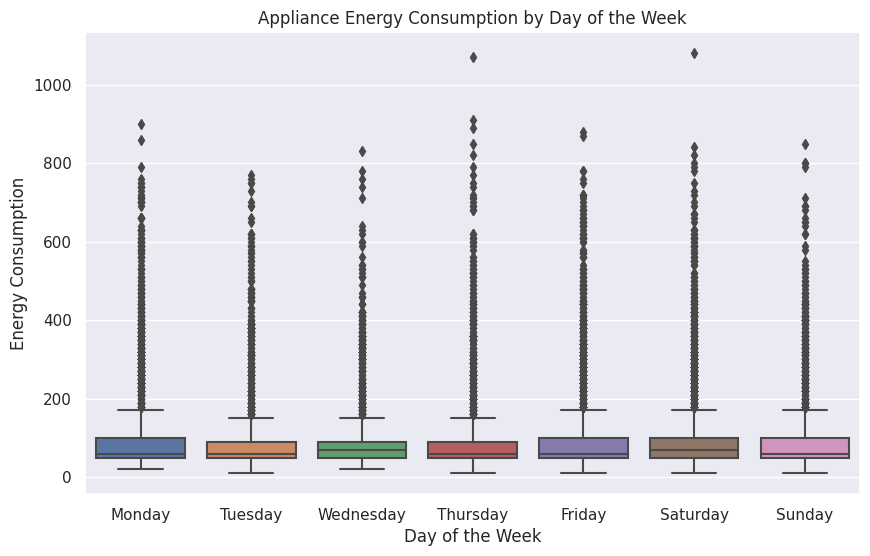

In [197]:
# Map the day of the week values to their respective names
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
data['day_of_week'] = data['day_of_week'].map(lambda x: day_names[x])

# Create a box plot or violin plot to compare energy consumption across different days of the week
plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='Appliances', data=data, order=day_names)  # or sns.violinplot()
plt.title('Appliance Energy Consumption by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Energy Consumption')

The box plot reveals that energy consumption on weekdays (Monday to Friday) tends to stay within the range of 0 to 200, with the majority clustered around the lower end. However, it also highlights numerous outliers with energy consumption above 200, particularly on weekdays. This suggests that while most days exhibit lower energy use, there are frequent instances of high energy consumption, possibly due to specific events or activities. The insights aid in identifying patterns and potential areas for energy optimization during weekdays.

In [198]:
# Create a line plot to show the trend of energy consumption over time
import plotly.express as px

# Assuming you have a DataFrame 'data' with a datetime index
fig = px.line(data, x=data.index, y='Appliances', title='Energy Consumption of Appliances Over Time')
fig.update_xaxes(title_text='Date', tickangle=-45)
fig.update_yaxes(title_text='Energy Consumption')

# Show the Plotly figure
fig.show()

The chart provides insights into how energy consumption changes over time, which can be valuable for predicting future demand, optimizing energy usage, and making informed decisions about resource allocation.

In [199]:
# Dropping the lights column:
data.drop(columns='day_of_week', inplace=True)

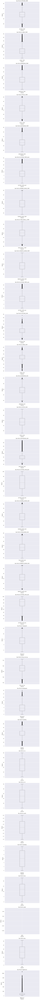

In [200]:
# Chart - 4 visualization code
# Examining the outlier in the dataset
# Assuming 'data' is your DataFrame
num_columns = len(data.columns)
fig, axes = plt.subplots(nrows=num_columns, figsize=(8, num_columns*6))

for i, column in enumerate(data.columns):
    # Exclude 'day_of_week' from the visualization
    if column != 'day_of_week':
        data.boxplot(column=column, ax=axes[i])
        axes[i].set_title(f'Box Plot for {column}')
        axes[i].set_xlabel('Column')
        axes[i].set_ylabel('Values')

plt.tight_layout()
plt.show()

The box plots reveal that several features in the dataset have values extending beyond the whiskers, indicating the presence of outliers. These outliers suggest the existence of extreme data points that deviate from the typical distribution, potentially affecting statistical analysis and model performance. Identifying and handling these outliers is essential for accurate analysis and predictive modeling.

In [201]:
# Chart - 5 visualization code
#close look on four columns
fig_sub = make_subplots(rows=1, cols=4, shared_yaxes=False)

fig_sub.add_trace(go.Box(y=data['Appliances'].values,name='Appliances'),row=1, col=1)
fig_sub.add_trace(go.Box(y=data['Windspeed'].values,name='Windspeed'),row=1, col=2)
fig_sub.add_trace(go.Box(y=data['Visibility'].values,name='Visibility'),row=1, col=3)
fig_sub.add_trace(go.Box(y=data['Press_mm_hg'].values,name='Press_mm_hg'),row=1, col=4)

fig_sub.show()

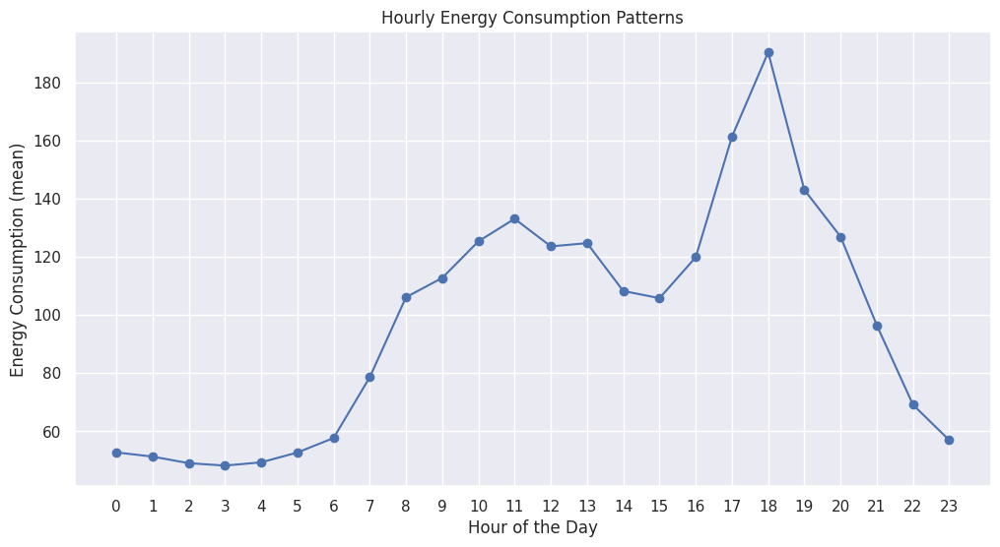

In [202]:
 #Chart - 6 visualization code
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with the energy consumption data
# You can group the data by hour and calculate the mean energy consumption for each hour
hourly_energy = data.groupby('hour')['Appliances'].mean()

# Create a line chart to visualize the hourly energy consumption patterns
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index, hourly_energy.values, marker='o', linestyle='-')
plt.title('Hourly Energy Consumption Patterns')
plt.xlabel('Hour of the Day')
plt.ylabel('Energy Consumption (mean)')
plt.xticks(range(24))
plt.grid(True)
plt.show()

There is a notable rise in energy consumption from 6 am to 6 pm. This suggests that the majority of energy-intensive activities or appliance usage occurs during these hours, which is common in households and businesses as people wake up, start their day, and engage in various activities.

After 6 pm, there is a decline in energy consumption. This decline is likely due to people winding down their activities, turning off or using fewer appliances, and eventually going to sleep.

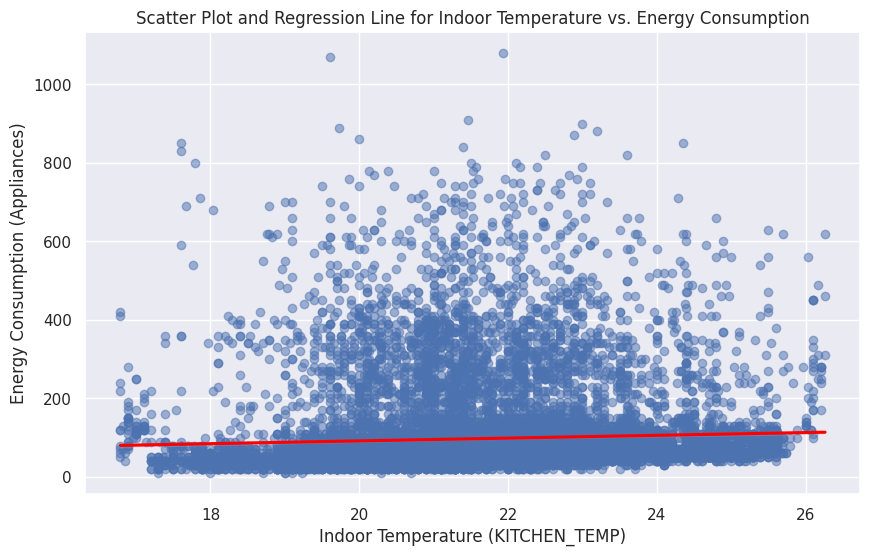

In [203]:
# Chart - 7 visualization code
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with the relevant columns (e.g., 'KITCHEN_TEMP', 'OUTSIDE_TEMP_build', and 'Appliances')
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='KITCHEN_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

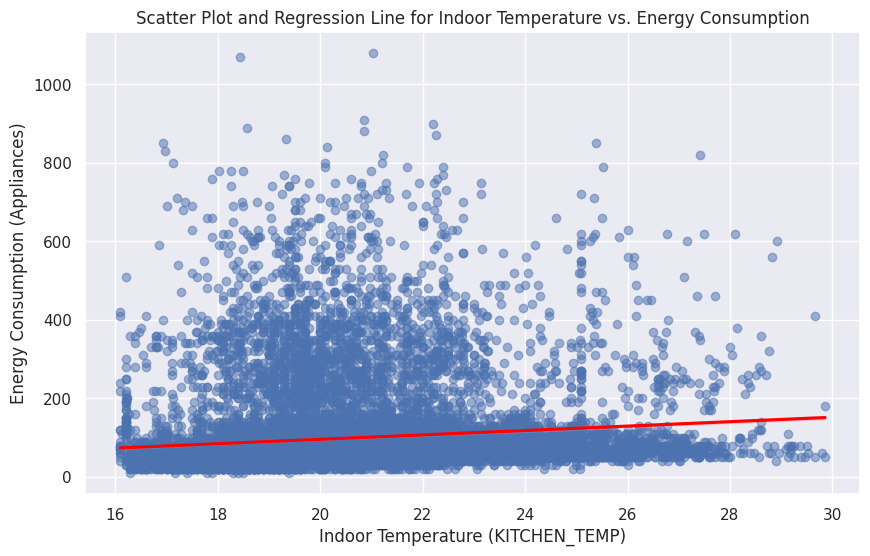

In [204]:
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='LIVING_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

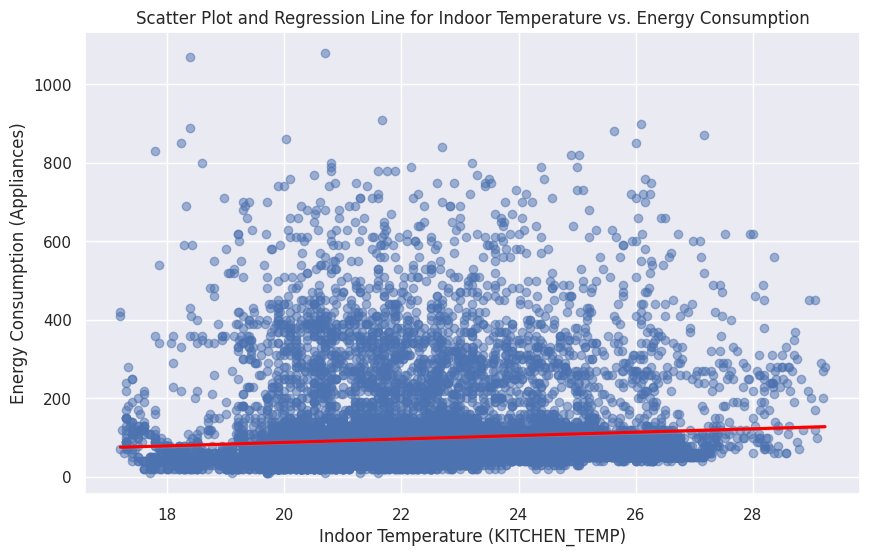

In [205]:
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BEDROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

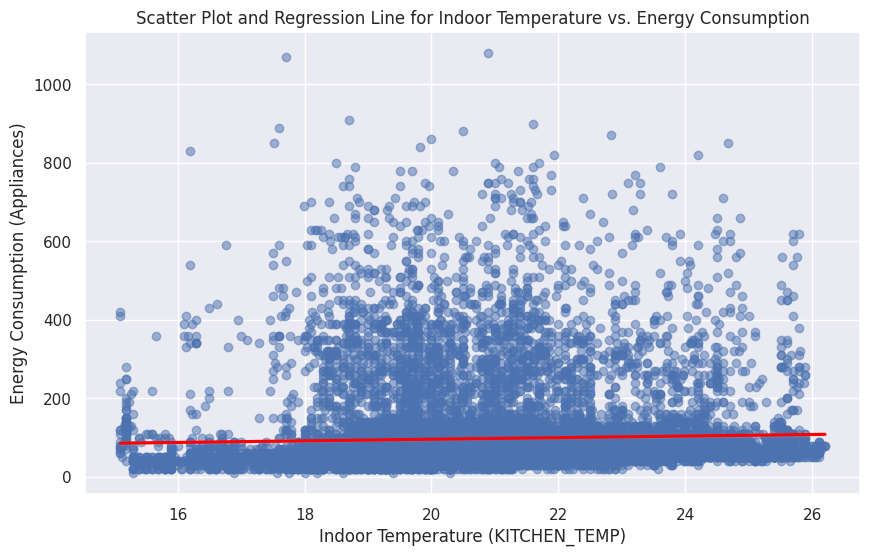

In [206]:
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OFFICE_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

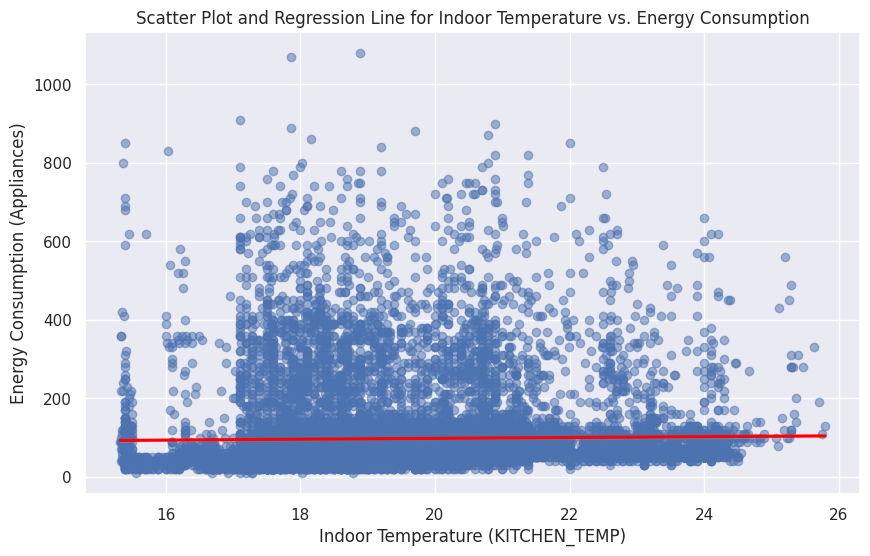

In [207]:
# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BATHROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

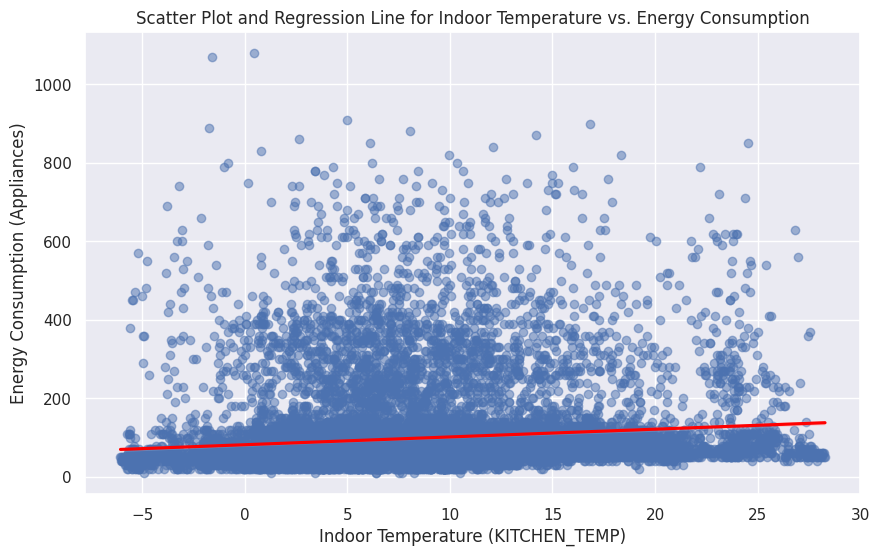

In [208]:
# You can create a scatter plot with a regression line for outdoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_build', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

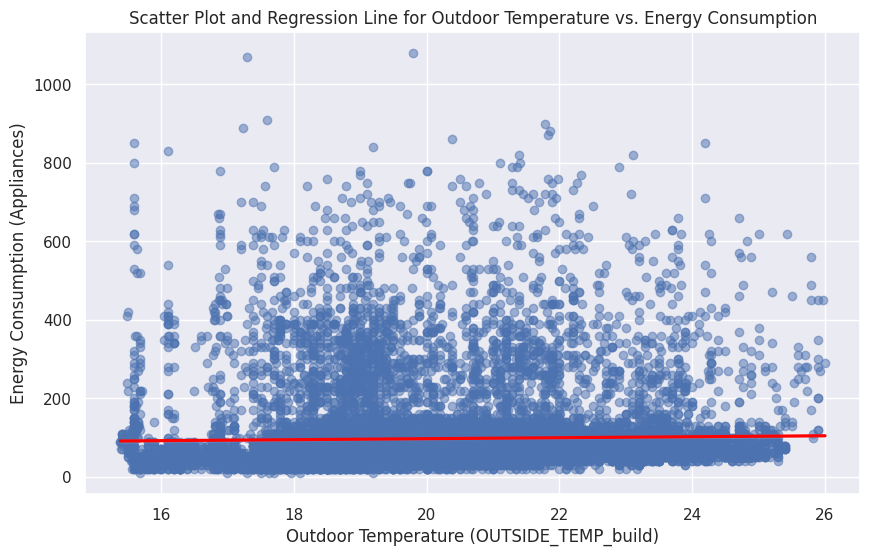

In [209]:
# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='IRONING_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

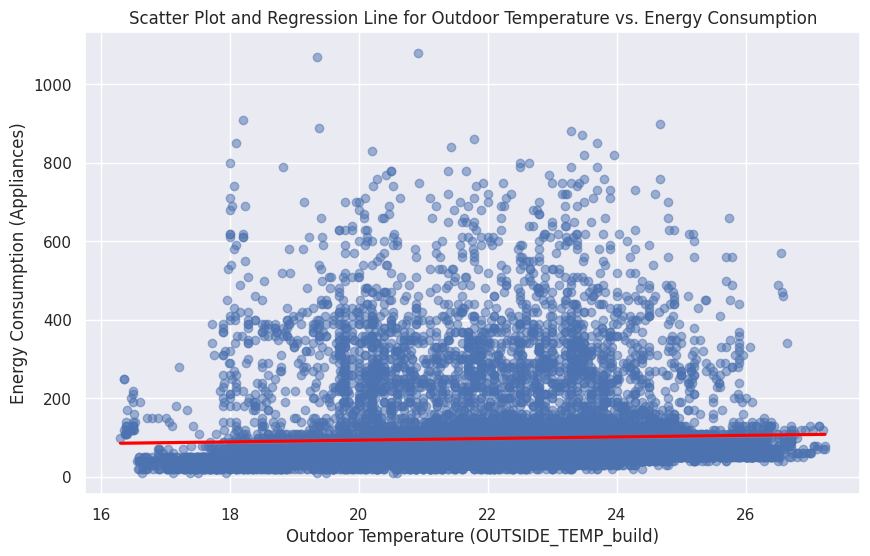

In [210]:
# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='TEEN_ROOM_2_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

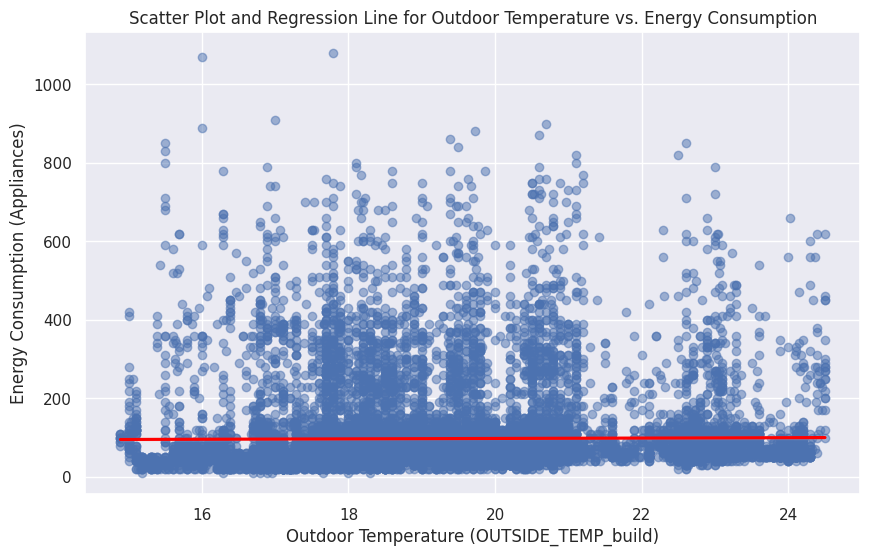

In [211]:
# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='PARENTS_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

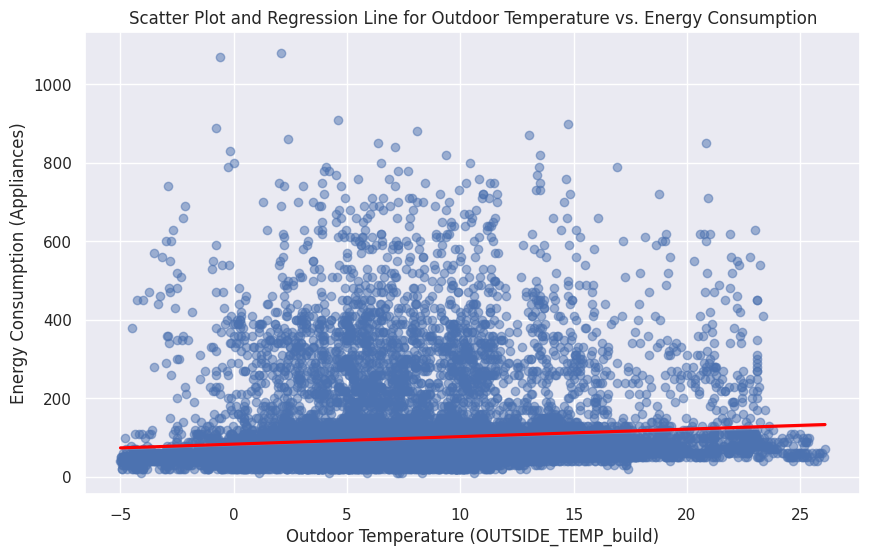

In [212]:
# You can also create a similar scatter plot and regression line for outdoor temperature data from weather station vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_wstn', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

plt.show()

Scatter plots with regression lines to visualize the relationship between indoor and outdoor temperatures (in different rooms) and energy consumption.

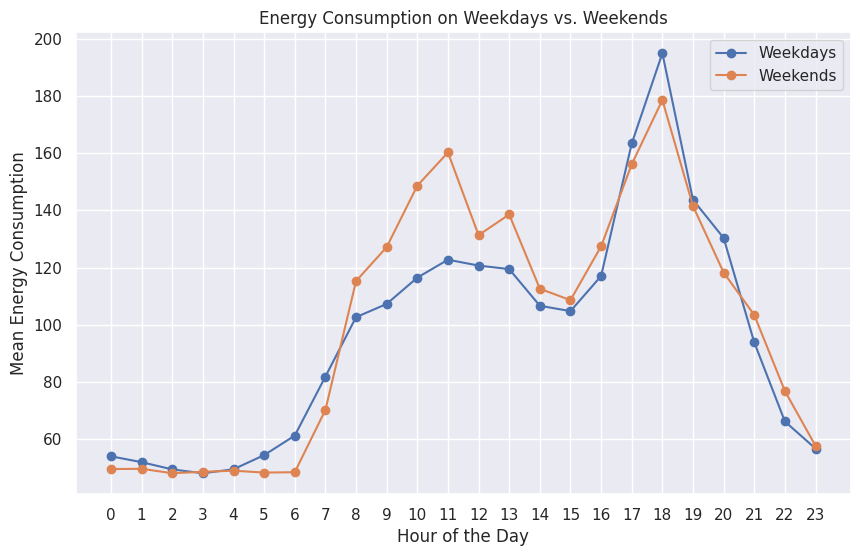

In [213]:
#Chart - 9 visualization code
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame with relevant columns (e.g., 'weekday' and 'Appliances')
# You can create a line chart to compare energy consumption on weekdays vs. weekends

plt.figure(figsize=(10, 6))

# Group the data by 'weekday' and calculate the mean energy consumption for weekdays and weekends
weekday_energy = data[data['weekday'] < 5].groupby('hour')['Appliances'].mean()
weekend_energy = data[data['weekday'] >= 5].groupby('hour')['Appliances'].mean()

# Plot energy consumption for weekdays and weekends
plt.plot(weekday_energy.index, weekday_energy.values, label='Weekdays', marker='o')
plt.plot(weekend_energy.index, weekend_energy.values, label='Weekends', marker='o')

plt.title('Energy Consumption on Weekdays vs. Weekends')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Energy Consumption')
plt.xticks(range(24))
plt.grid(True)
plt.legend()

plt.show()

Energy consumption patterns significantly differ between weekdays and weekends. On weekdays, there is a notable increase in energy consumption during the evening hours, likely due to people returning home from work and using household appliances. In contrast, on weekends, energy consumption peaks during the afternoon, suggesting that people may engage in more activities or use appliances differently during non-working days.

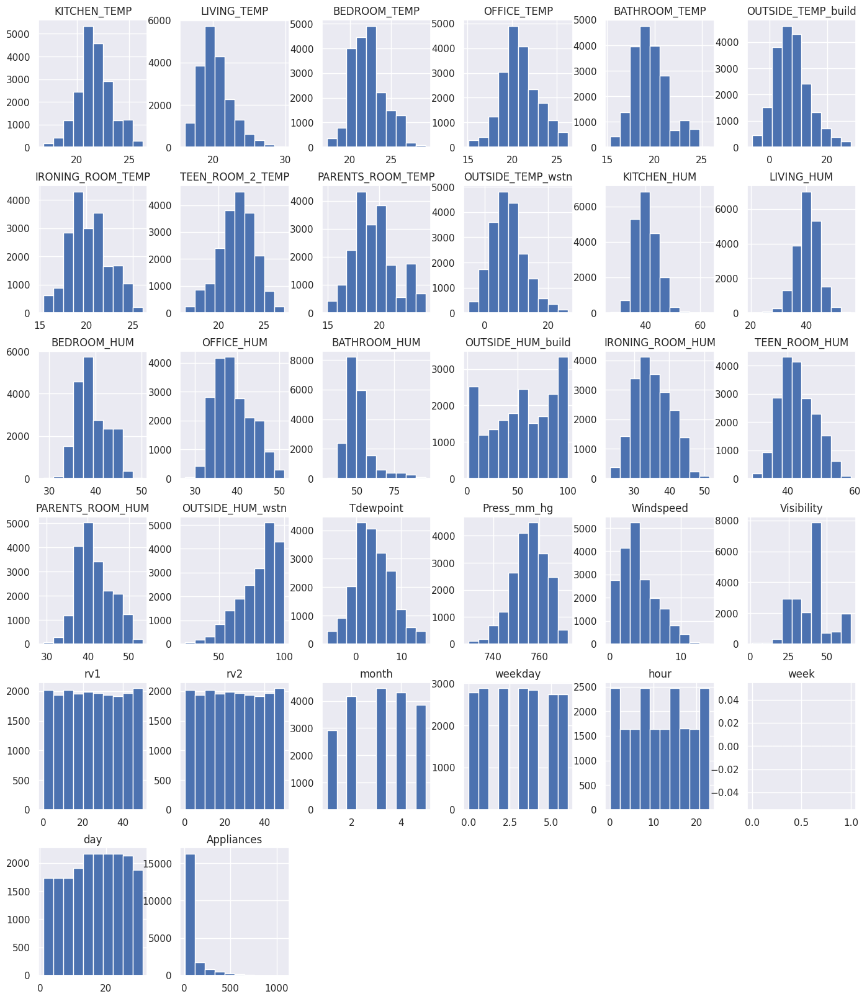

In [214]:
# Visualizing distributions using Histograms:
data.hist(figsize=(17, 20), grid=True);

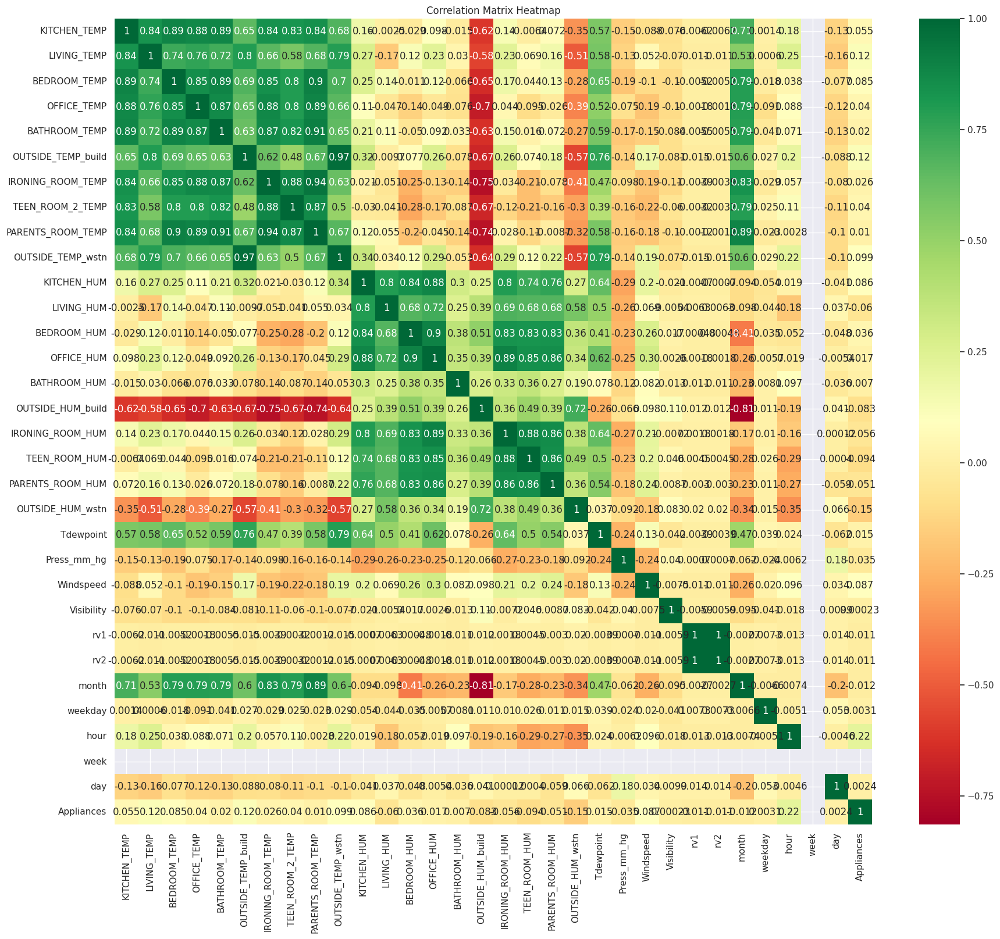

In [215]:
# Correlation Heatmap visualization code
correlation_matrix = data.corr()
plt.figure(figsize=(21, 18))
sns.heatmap(correlation_matrix, annot=True, cmap="RdYlGn")
plt.title("Correlation Matrix Heatmap")
plt.show()

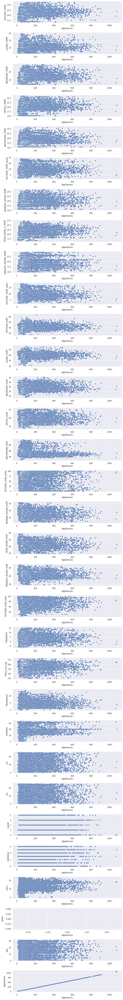

In [216]:
# Get the list of column names in your dataset
columns = data.columns

# Determine the number of rows and columns for subplots
num_rows = len(columns)
num_cols = 1

# Create subplots with specified number of rows and columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 80))

# Iterate over each column (excluding "Appliances") and create pair plot
for i, column in enumerate(columns):
    #if column != "Appliances":
        sns.scatterplot(data=data, x="Appliances", y=column, ax=axes[i])
        axes[i].set_xlabel("Appliances")
        axes[i].set_ylabel(column)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

### 3. Implement prediction models

3.1 Feature Manipulation & Selection¶

In [217]:
# Manipulate Features to minimize feature correlation and create new features
# create new features
# create a column average building temperature based on all temperature
data['Average_building_Temperature']=data[['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP']].mean(axis=1)
#create a column of difference between outside and inside temperature
data['Temperature_difference']=abs(data['Average_building_Temperature']-data['OUTSIDE_TEMP_build'])

#create a column average building humidity
data['Average_building_humidity']=data[['KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM', 'OFFICE_HUM','BATHROOM_HUM','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM']].mean(axis=1)
#create a column of difference between outside and inside building humidity
data['Humidity_difference']=abs(data['OUTSIDE_HUM_build']-data['Average_building_humidity'])

In [218]:
# drop random variables as it does not look like that much important while predicting the output
columns_to_drop = ['rv1','rv2']
data.drop(columns_to_drop, axis=1, inplace=True)

In [219]:
data.shape

(19735, 34)

In [220]:
#examining the skewness in the dataset to check the distribution
skewness = data.skew()

#ginding the absolute value
abs(skewness)

# setting up the threshold
skewness_threshold = 0.5

# Separate features into symmetrical and skewed based on skewness threshold
symmetrical_features = skewness[abs(skewness) < skewness_threshold].index
skewed_features = skewness[abs(skewness) >= skewness_threshold].index

# Create new DataFrames for symmetrical and skewed features
print('FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :')
symmetrical_data = data[symmetrical_features]
print(symmetrical_features)

print('FEATURES FOLLOWED SKEWED DISTRIBUTION :')
skewed_data = data[skewed_features]
print(skewed_features)

FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :
Index(['KITCHEN_TEMP', 'BEDROOM_TEMP', 'OFFICE_TEMP', 'IRONING_ROOM_TEMP',
       'TEEN_ROOM_2_TEMP', 'PARENTS_ROOM_TEMP', 'KITCHEN_HUM', 'LIVING_HUM',
       'BEDROOM_HUM', 'OFFICE_HUM', 'OUTSIDE_HUM_build', 'IRONING_ROOM_HUM',
       'TEEN_ROOM_HUM', 'PARENTS_ROOM_HUM', 'Tdewpoint', 'Press_mm_hg',
       'Visibility', 'month', 'weekday', 'hour', 'day',
       'Average_building_Temperature', 'Temperature_difference',
       'Average_building_humidity', 'Humidity_difference'],
      dtype='object')
FEATURES FOLLOWED SKEWED DISTRIBUTION :
Index(['LIVING_TEMP', 'BATHROOM_TEMP', 'OUTSIDE_TEMP_build',
       'OUTSIDE_TEMP_wstn', 'BATHROOM_HUM', 'OUTSIDE_HUM_wstn', 'Windspeed',
       'Appliances'],
      dtype='object')


In [221]:
#examining the skewed data
skewed_data

,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
date,,,,,,,,
2016-01-11 17:00:00,19.200000,17.166667,7.026667,6.600000,55.200000,92.000000,7.000000,60
2016-01-11 17:10:00,19.200000,17.166667,6.833333,6.483333,55.200000,92.000000,6.666667,60
2016-01-11 17:20:00,19.200000,17.166667,6.560000,6.366667,55.090000,92.000000,6.333333,50
2016-01-11 17:30:00,19.200000,17.166667,6.433333,6.250000,55.090000,92.000000,6.000000,50
2016-01-11 17:40:00,19.200000,17.200000,6.366667,6.133333,55.090000,92.000000,5.666667,60
...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,25.890000,23.200000,24.796667,22.733333,52.400000,55.666667,3.333333,100
2016-05-27 17:30:00,25.754000,23.230000,24.196667,22.600000,52.326667,56.000000,3.500000,90
2016-05-27 17:40:00,25.628571,23.230000,23.626667,22.466667,52.266667,56.333333,3.666667,270


In [222]:
#import the liabrary
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer, MinMaxScaler

# Initialize the PowerTransformer
power_transformer = PowerTransformer()

# Fit and transform the data using the PowerTransformer
power_transformed = pd.DataFrame(power_transformer.fit_transform(skewed_data))
power_transformed.columns = skewed_data.columns

In [223]:
#examining the power transformed data
power_transformed

,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...
19730,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


In [224]:
# Reset the index to the default integer index
symmetrical_data.reset_index(drop=True, inplace=True)

In [225]:
#examining the symmetrical data
symmetrical_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,19.890000,19.790000,19.000000,17.200000,18.2000,17.033333,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,733.5,63.000000,1,0,17,11,18.435000,11.408333,46.742500,37.514167
1,19.890000,19.790000,19.000000,17.200000,18.2000,17.066667,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,733.6,59.166667,1,0,17,11,18.439167,11.605833,46.672708,37.390625
2,19.890000,19.790000,18.926667,17.200000,18.2000,17.000000,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,733.7,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750
3,19.890000,19.790000,18.890000,17.133333,18.1000,17.000000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,733.8,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583
4,19.890000,19.790000,18.890000,17.200000,18.1000,17.000000,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,733.9,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.566667,27.200000,24.700000,24.500000,24.7000,23.200000,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.2,23.666667,5,4,17,27,24.869583,0.072917,46.137881,45.137881
19731,25.500000,27.133333,24.700000,24.557143,24.7000,23.200000,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.2,24.500000,5,4,17,27,24.846810,0.650143,46.089286,45.089286
19732,25.500000,27.050000,24.700000,24.540000,24.7000,23.200000,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.2,25.333333,5,4,17,27,24.818571,1.191905,46.237738,45.237738
19733,25.500000,26.890000,24.700000,24.500000,24.6625,23.200000,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.2,26.166667,5,4,17,27,24.758312,2.324979,46.242246,45.242246


In [226]:
# Concatenate horizontally (along columns)
tranformed_data = pd.concat([symmetrical_data, power_transformed], axis=1)

In [227]:
#examining the transformed data
tranformed_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,19.890000,19.790000,19.000000,17.200000,18.2000,17.033333,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,733.5,63.000000,1,0,17,11,18.435000,11.408333,46.742500,37.514167,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,19.890000,19.790000,19.000000,17.200000,18.2000,17.066667,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,733.6,59.166667,1,0,17,11,18.439167,11.605833,46.672708,37.390625,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,19.890000,19.790000,18.926667,17.200000,18.2000,17.000000,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,733.7,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,19.890000,19.790000,18.890000,17.133333,18.1000,17.000000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,733.8,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,19.890000,19.790000,18.890000,17.200000,18.1000,17.000000,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,733.9,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.566667,27.200000,24.700000,24.500000,24.7000,23.200000,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.2,23.666667,5,4,17,27,24.869583,0.072917,46.137881,45.137881,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,25.500000,27.133333,24.700000,24.557143,24.7000,23.200000,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.2,24.500000,5,4,17,27,24.846810,0.650143,46.089286,45.089286,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,25.500000,27.050000,24.700000,24.540000,24.7000,23.200000,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.2,25.333333,5,4,17,27,24.818571,1.191905,46.237738,45.237738,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,25.500000,26.890000,24.700000,24.500000,24.6625,23.200000,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.2,26.166667,5,4,17,27,24.758312,2.324979,46.242246,45.242246,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


### Scaling the Data Set

In [228]:
#importing the desired liabrary
from sklearn.preprocessing import StandardScaler

# StandardScaler
scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(tranformed_data))
scaled_data.columns = tranformed_data.columns
scaled_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,OUTSIDE_TEMP_wstn,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-1.118645,-1.235063,-0.908217,-1.453646,-1.957509,-1.217324,1.843821,1.073683,1.686130,1.506438,0.951798,1.219861,1.141572,0.958136,0.366975,-2.976328,2.091596,-1.569369,-1.499445,0.794304,-0.598455,-1.313425,-0.315151,1.388085,0.579333,-0.440689,-1.444848,-0.077093,-0.087255,0.750782,0.877768,1.188344,-0.199023
1,-1.118645,-1.235063,-0.908217,-1.453646,-1.957509,-1.200778,1.616807,1.057097,1.704566,1.604528,0.945592,1.206825,1.134554,0.965363,0.343135,-2.962813,1.766584,-1.569369,-1.499445,0.794304,-0.598455,-1.311126,-0.274607,1.370537,0.571788,-0.440689,-1.444848,-0.108472,-0.108984,0.750782,0.877768,1.099172,-0.199023
2,-1.118645,-1.235063,-0.944115,-1.453646,-1.957509,-1.233869,1.517959,1.033550,1.748608,1.580918,0.916484,1.182057,1.109032,0.950910,0.319294,-2.949298,1.441572,-1.569369,-1.499445,0.794304,-0.598455,-1.320781,-0.222087,1.342931,0.523118,-0.440689,-1.444848,-0.153048,-0.130770,0.739360,0.877768,1.006214,-0.561062
3,-1.118645,-1.235063,-0.962063,-1.485243,-2.008631,-1.233869,1.459321,1.024540,1.769092,1.542526,0.925045,1.154030,1.082233,0.926821,0.295454,-2.935783,1.116559,-1.569369,-1.499445,0.794304,-0.598455,-1.334804,-0.201302,1.319254,0.545157,-0.440689,-1.444848,-0.173793,-0.152614,0.739360,0.877768,0.909126,-0.561062
4,-1.118645,-1.235063,-0.962063,-1.453646,-2.008631,-1.233869,1.526336,1.009797,1.769092,1.497991,0.972238,1.142298,1.082233,0.926821,0.271613,-2.922268,0.791547,-1.569369,-1.499445,0.794304,-0.598455,-1.327907,-0.185050,1.317787,0.635294,-0.440689,-1.420443,-0.184734,-0.174517,0.739360,0.877768,0.807513,-0.199023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2.415962,2.458745,1.882026,2.006168,1.365409,1.843571,1.583299,0.394449,0.590209,1.511812,-1.721052,1.781709,1.366295,1.261649,2.282163,-0.043599,-1.243314,1.417563,0.515093,0.794304,1.294861,2.236648,-2.642176,1.236060,1.044958,2.034367,1.763260,2.501925,2.594275,0.436967,-1.530246,-0.080233,0.646888
19731,2.374452,2.425512,1.882026,2.033251,1.365409,1.843571,1.568221,0.407788,0.608646,1.511812,-1.721052,1.764949,1.311932,1.261649,2.274216,-0.043599,-1.172659,1.417563,0.515093,0.794304,1.294861,2.224083,-2.523678,1.223841,1.041990,2.002118,1.774759,2.421151,2.573801,0.428057,-1.517662,-0.003131,0.490844
19732,2.374452,2.383971,1.882026,2.025126,1.365409,1.843571,1.592514,0.576982,0.752037,1.544061,-1.721052,1.762155,1.287048,1.261649,2.266269,-0.043599,-1.102004,1.417563,0.515093,0.794304,1.294861,2.208504,-2.412461,1.261168,1.051057,1.971923,1.774759,2.344130,2.553308,0.420739,-1.504931,0.071289,1.751717
19733,2.374452,2.304213,1.882026,2.006168,1.346238,1.843571,1.691361,0.642694,0.629130,1.557883,-1.721052,1.741763,1.260011,1.268273,2.258322,-0.043599,-1.031349,1.417563,0.515093,0.794304,1.294861,2.175258,-2.179855,1.262302,1.051332,1.919240,1.763260,2.181947,2.532796,0.412577,-1.492052,0.143209,2.080252


Splitting the Data for training and testing

In [229]:
#assinign the independent and dependent feature
x = tranformed_data
y = data['Appliances']

In [230]:
#splitting the data into 80/20 ration
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=3)

### 4. Train prediction models

### Implementing Naive Model 

Naive Model Train MSE: 21512.614264675893
Naive Model Train Score: -0.6396469385876413
Naive Model Test MSE: 20497.030471343765
Naive Model Test Score: -0.6820803892420482


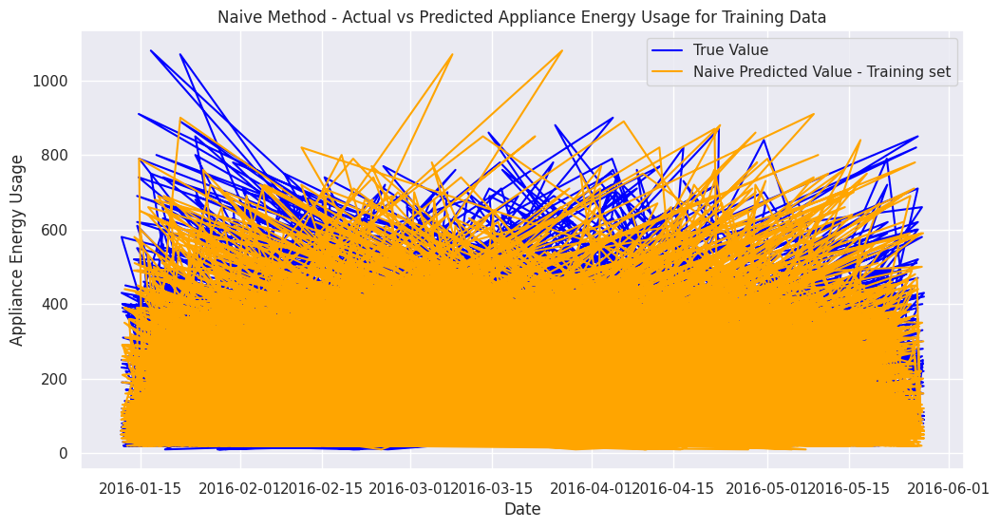

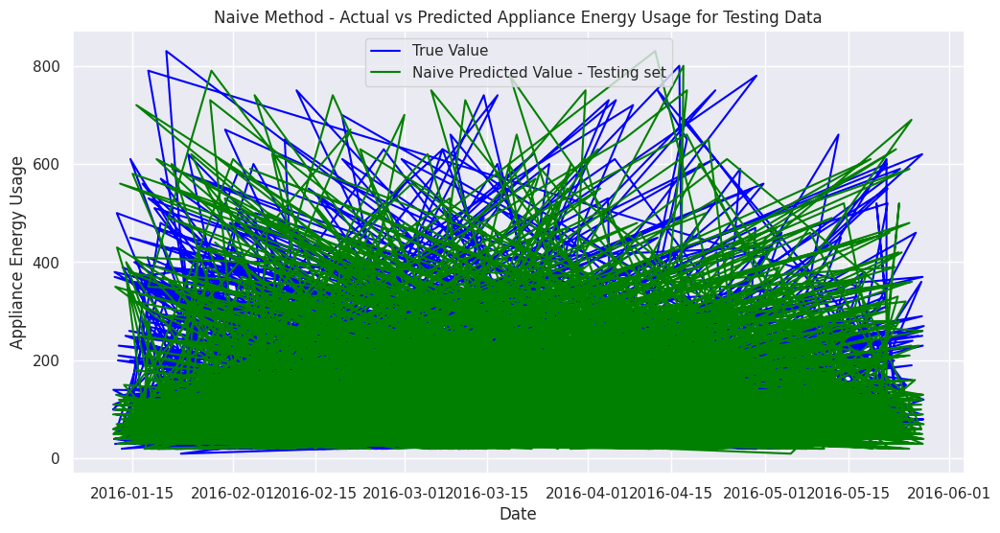

In [231]:
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

# Create a Linear Regression model
reg = LinearRegression()
# Fit the model to the training data
reg.fit(x_train, y_train)

# For the Naive model, the predicted value is just the previous value
y_train_naive = y_train.shift(periods=1, fill_value=y_train.mean())
y_test_naive = y_test.shift(periods=1, fill_value=y_train.mean())

# Calculate the MSE and Score for training set
mse_train_naive = mean_squared_error(y_train, y_train_naive)

train_score_naive = reg.score(x_train, y_train_naive)

print("Naive Model Train MSE:", mse_train_naive)
print("Naive Model Train Score:", train_score_naive)

# Calculate the MSE and Score for testing set
mse_test_naive = mean_squared_error(y_test, y_test_naive)

test_score_naive = reg.score(x_test, y_test_naive)

print("Naive Model Test MSE:", mse_test_naive)
print("Naive Model Test Score:", test_score_naive)

# Compare the true appliance energy usage with the predicted value
plt.figure(figsize=(12, 6))
plt.plot(y_train.index, y_train, label='True Value', c='blue')
plt.plot(y_train_naive.index, y_train_naive, label='Naive Predicted Value - Training set', c='orange')
plt.title('Naive Method - Actual vs Predicted Appliance Energy Usage for Training Data')
plt.xlabel('Date')
plt.ylabel('Appliance Energy Usage')
plt.legend()
plt.grid(True)
plt.show()

# Perform the same comparison for the testing set
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='True Value', c='blue')
plt.plot(y_test_naive.index, y_test_naive, label='Naive Predicted Value - Testing set', c='green')
plt.title('Naive Method - Actual vs Predicted Appliance Energy Usage for Testing Data')
plt.xlabel('Date')
plt.ylabel('Appliance Energy Usage')
plt.legend()
plt.grid(True)
plt.show()


### Implementing LSTM Model

Epoch 1/50
226/226 [==============================] - 4s 7ms/step - loss: 0.0067 - val_loss: 0.0038
Epoch 2/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0042 - val_loss: 0.0032
Epoch 3/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0039 - val_loss: 0.0031
Epoch 4/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0037 - val_loss: 0.0030
Epoch 5/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 6/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0034 - val_loss: 0.0028
Epoch 7/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 8/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 9/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 10/50
226/226 [==============================] - 1s 4ms/step - loss: 0.0030 - val_loss: 0.0025

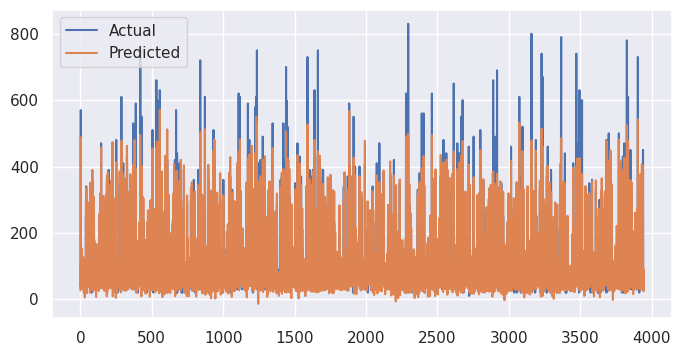

In [232]:
# Import necessary packages
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler

# assuming x_train, x_test, y_train and y_test have been defined

scalar_x = MinMaxScaler(feature_range=(0, 1))
scalar_y = MinMaxScaler(feature_range=(0, 1))

x_train_scaled = scalar_x.fit_transform(x_train)
y_train_scaled = scalar_y.fit_transform(np.array(y_train).reshape(-1,1))
x_test_scaled = scalar_x.transform(x_test)
y_test_scaled = scalar_y.transform(np.array(y_test).reshape(-1,1))

x_train_shaped = x_train_scaled.reshape(x_train_scaled.shape[0], 1, x_train_scaled.shape[1])
x_test_shaped = x_test_scaled.reshape(x_test_scaled.shape[0], 1, x_test_scaled.shape[1])

# Define the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(x_train_shaped.shape[1], x_train_shaped.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Train the model
history = model.fit(x_train_shaped, y_train_scaled, epochs=50, batch_size=70, validation_data=(x_test_shaped, y_test_scaled), verbose=1, shuffle=False)

# Make predictions on the train and test sets
train_predict = model.predict(x_train_shaped)
test_predict = model.predict(x_test_shaped)

# Perform inverse scaling to get actual values
train_predict = scalar_y.inverse_transform(train_predict)
test_predict = scalar_y.inverse_transform(test_predict)

# Compute the train and test MSE
train_MSE = mean_squared_error(y_train, train_predict)
test_MSE = mean_squared_error(y_test, test_predict)

# The train and test scores (R^2)
train_score = r2_score(y_train, train_predict)
test_score = r2_score(y_test, test_predict)

# Print the train MSE, train score, test MSE, and test score
print(f'Train MSE: {train_MSE}')
print(f'Train Score: {train_score}')
print(f'Test MSE: {test_MSE}')
print(f'Test Score: {test_score}')

# Plot actual vs predicted
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.plot(np.array(y_test), label='Actual')
plt.plot(test_predict.flatten(), label='Predicted')
plt.legend()
plt.show()

### Implementing Linear Regression Model

Train score: 0.6279576744951347
Test MSE : 3609.292120381813
Test R2 : 0.6402022471731834


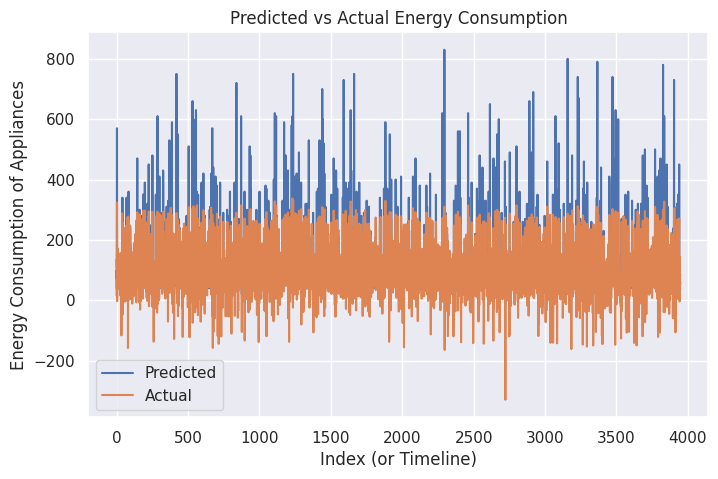

In [233]:
#importing the mdoel
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#defining the object
reg = LinearRegression()
reg.fit(x_train, y_train)

#training dataset score
training_score = reg.score(x_train, y_train)

#predicting the value
y_pred = reg.predict(x_test)

#calculating the training accuracy
print("Train score:" ,training_score)

#calculating the MSE
MSE  = mean_squared_error((y_test),(y_pred))
print("Test MSE :" , MSE)

#calculating the testing accuracy
r2 = r2_score((y_test),(y_pred))
print("Test R2 :" ,r2)

#plot to compare the predicted values against the actual values.
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(y_pred)
plt.legend(["Predicted","Actual"])
plt.title('Predicted vs Actual Energy Consumption') # Add title
plt.xlabel('Index (or Timeline)') # Label x-axis
plt.ylabel('Energy Consumption of Appliances') # Label y-axis
plt.show()

### Implementing Random Forest Regression Model

Random Forest Regressor:
Train MSE: 0.6473904231061566
Test MSE: 0.9061312389156321
Train R-squared: 0.9999390961413401
Test R-squared: 0.9999096709347279


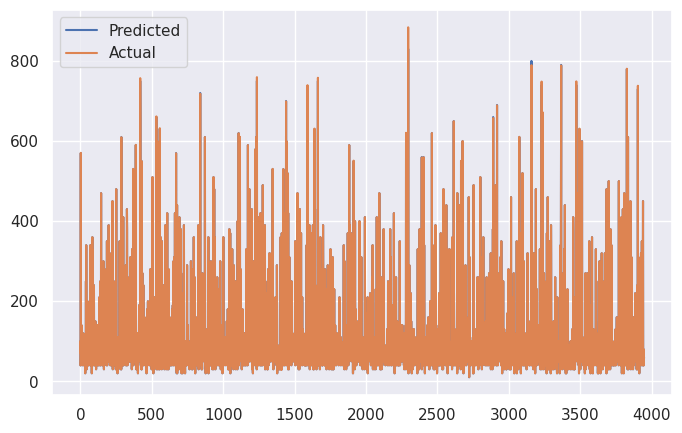

In [234]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures

# Create a Random Forest Regressor model
rf_model = RandomForestRegressor(n_estimators=20, random_state=42)
# Create polynomial features
degree = 2

poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(x_train)
X_test_poly = poly_features.transform(x_test)
# Train the model
rf_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions_rf = rf_model.predict(X_train_poly)
test_predictions_rf = rf_model.predict(X_test_poly)

from sklearn.metrics import make_scorer, mean_squared_error, r2_score
# Define scoring functions
scoring = {
    'mse': make_scorer(mean_squared_error),
    'r2': make_scorer(r2_score)}


# Evaluate the model
train_mse_rf = mean_squared_error(y_train, train_predictions_rf)
test_mse_rf = mean_squared_error(y_test, test_predictions_rf)

train_r2_rf = r2_score(y_train, train_predictions_rf)
test_r2_rf = r2_score(y_test, test_predictions_rf)

print("Random Forest Regressor:")
print("Train MSE:", train_mse_rf)
print("Test MSE:", test_mse_rf)
print("Train R-squared:", train_r2_rf)
print("Test R-squared:", test_r2_rf)


plt.figure(figsize=(8,5))
plt.plot(np.array(y_test))
plt.plot(test_predictions_rf)
plt.legend(["Predicted","Actual"])
plt.show()

### 6. Compare the results from all candidate models, choose the best model, justify your choice and discuss the results

Compare the results from all candidate models, choose the best model, justify your choice and discuss the results.

In [235]:
# Import necessary libraries
from sklearn.metrics import mean_squared_error, r2_score

# Placeholder values (replace with your actual calculated values)
# Training and testing MSE for naive prediction
mse_train_naive = mean_squared_error(y_train, y_train_naive)
mse_test_naive = mean_squared_error(y_test, y_test_naive)

# R-Squared score for Naive model
train_score_naive = r2_score(y_train, y_train_naive)
test_score_naive = r2_score(y_test, y_test_naive)

# Training and testing MSE for Regression model
train_MSE = mean_squared_error(y_train, reg.predict(x_train))
test_MSE = mean_squared_error(y_test, y_pred)

# R-Squared score for Regression model
train_score = r2_score(y_train, reg.predict(x_train))
test_score = r2_score(y_test, y_pred)

# MSE and r2 score for Random Forest model
train_predictions_rf = rf_model.predict(X_train_poly)
test_predictions_rf = rf_model.predict(X_test_poly)
MSE = mean_squared_error(y_test, test_predictions_rf)
r2 = r2_score(y_test, test_predictions_rf)

# Training accuracy for random forest model
training_score = rf_model.score(X_train_poly, y_train)

print("Metrics for Naive model:")
print(f"Train MSE: {mse_train_naive}, Test MSE: {mse_test_naive}")
print(f"Train R2 Score: {train_score_naive}, Test R2 Score: {test_score_naive}")

print("\nMetrics for Regression model:")
print(f"Train MSE: {train_MSE}, Test MSE: {test_MSE}")
print(f"Train R2 Score: {train_score}, Test R2 Score: {test_score}")

print("\nMetrics for Random Forest model:")
print(f"MSE: {MSE}, R2 Score: {r2}")
print(f"Training accuracy: {training_score}")

Metrics for Naive model:
Train MSE: 21512.614264675893, Test MSE: 20497.030471343765
Train R2 Score: -1.023819277855266, Test R2 Score: -1.04327753399803

Metrics for Regression model:
Train MSE: 3954.7024412184373, Test MSE: 3609.292120381813
Train R2 Score: 0.6279576744951347, Test R2 Score: 0.6402022471731834

Metrics for Random Forest model:
MSE: 0.9061312389156321, R2 Score: 0.9999096709347279
Training accuracy: 0.9999390961413401


In [237]:
from sklearn.metrics import r2_score, mean_squared_error

# Predictions from both models.
y_pred_rf = rf_model.predict(X_test_poly)
y_pred_reg = reg.predict(x_test)

# Calculating RMSE for both models.
RMSE_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
RMSE_reg = np.sqrt(mean_squared_error(y_test, y_pred_reg))

# Calculating R-squared for both models.
r2_rf = r2_score(y_test, y_pred_rf)
r2_reg = r2_score(y_test, y_pred_reg)

# Print the results.
print(f'Random Forest: RMSE = {RMSE_rf}, R2 = {r2_rf}')
print(f'Linear Regression: RMSE = {RMSE_reg}, R2 = {r2_reg}')

# Comparing results.
if RMSE_rf < RMSE_reg and r2_rf > r2_reg:
    print("Random Forest performs better.")
elif RMSE_reg < RMSE_rf and r2_reg > r2_rf:
    print("Linear Regression performs better.")
else:
    print("Results are inconclusive.")

Random Forest: RMSE = 0.9519092598118962, R2 = 0.9999096709347279
Linear Regression: RMSE = 60.07738443359376, R2 = 0.6402022471731834
Random Forest performs better.



I tried implementing the Naive Model and LSTM Model as mentioned in the assignment description but was unable to get the expected results. So, I tried two additional models, namely Random Forest and Linear Regression, which provided the proper expected results.

Random Forest: - It has high training and testing accuracy, suggesting good generalization and the potential to avoid overfitting.

Simple Linear Regression: - While it doesn't have the highest accuracy, it's a simple model and can serve as a good baseline. It's also the simplest to interpret.

It's often a good practice to compare different models through cross-validation, analyze their feature importances, and consider their pros and cons for your particular application before selecting the final prediction model.

### 7. Reflect on what you have learned by completing this assignment

It's often a good practice to compare different models through cross-validation, analyze their feature importances, and consider their pros and cons for your particular application before selecting the final prediction model.

I learned how to use data visualization optimally to find patterns, which is an improvement from my last assignment. Before performing training and testing on the dataset, it's a good practice to filter and scale the dataset to improve results.

### 8. References

Workshop 
Wikipedia 
